In [1]:
library(MASS)
library(Matrix)
library(reticulate)
library(data.table)

In [2]:
scATAC_ours <- readRDS("data/scATAC.raw.sparse_referenced.rds")
scRNA_ours <- readRDS("data/snRNA.raw.sparse_right_path.rds")

In [3]:
scATAC_theirs <- readRDS("sce_10xPBMC_atac.rds")
scRNA_theirs <- readRDS("sce_10xPBMC_rna.rds")

In [4]:
library(SingleCellExperiment)
library(DropletUtils)
library(scater)
library(ggplot2)

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: 'MatrixGenerics'


The following objects are masked from 'package:matrixStats':

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    rowOrderStats, rowProds, rowQuantiles, rowRanges

In [5]:
my_data = read.table("data/maize_leaf_harmony_integrated.v3.subLEIDEN.metadata.txt")
meta_data.matrix <- as.matrix(my_data)
#print(dim(meta_data.matrix))




In [6]:
norm.cnts <- log1p(scRNA_ours %*% Diagonal(x=1e4/Matrix::colSums(scRNA_ours)))
cell_type_label <- meta_data.matrix[, c("celltype_full")]
#pretend.cell.labels <- sample(cell_type_label, ncol(scRNA_ours), replace=TRUE)
#b <- SingleCellExperiment(list(counts=scRNA_ours, logcounts=norm.cnts), colData=DataFrame(cell_type=V))

ERROR: Error in meta_data.matrix[, c("celltype_full")]: subscript out of bounds


In [7]:
V <- as.list(as.data.frame(cell_type_label))
b <- SingleCellExperiment(list(counts=scRNA_ours, logcounts=norm.cnts), colData=DataFrame(cell_type=V))

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'as.list': error in evaluating the argument 'x' in selecting a method for function 'as.data.frame': object 'cell_type_label' not found


In [7]:
common_genes <- intersect(rownames(scATAC_ours),
                          rownames(scRNA_ours))

In [9]:
norm.cnts_RNA <- log1p((scRNA_ours[common_genes, ]) %*% Diagonal(x=1e4/Matrix::colSums(scRNA_ours[common_genes, ])))
#norm.cnts

In [10]:
colSums (logcounts(scRNA_theirs), na.rm = FALSE, dims = 1)
rowSums (logcounts(scRNA_theirs), na.rm = FALSE, dims = 1)
colMeans(logcounts(scRNA_theirs), na.rm = FALSE, dims = 1)
rowMeans(logcounts(scRNA_theirs), na.rm = FALSE, dims = 1)

AAACCCAGTATCGTAC-1 AAACCCAGTCGGTGAA-1 AAACCCAGTTAGAAAC-1 AAACCCAGTTATCTTC-1 
          2586.546           3558.454           4897.179           3539.983 
AAACCCAGTTGCCGAC-1 AAACCCATCAGACAAA-1 AAACCCATCCATACTT-1 AAACCCATCCATTCGC-1 
          4129.091           4103.109           4348.798           4964.697 
AAACGAACAACTCGAT-1 AAACGAACACCGAATT-1 AAACGAACAGACACCC-1 AAACGAACAGAGATTA-1 
          3049.793           3697.576           3946.804           4592.280 
AAACGAAGTATGCGGA-1 AAACGAAGTTCTATCT-1 AAACGAAGTTTCACTT-1 AAACGAATCATTTGTC-1 
          3806.225           4049.155           5712.229           4870.126 
AAACGAATCCGCTAGG-1 AAACGAATCGCCGAAC-1 AAACGAATCTACGCAA-1 AAACGCTAGGGCAGTT-1 
          3853.818           4751.002           4914.119           5258.441 
AAACGCTAGTATGTAG-1 AAACGCTCAGAGGTTG-1 AAACGCTGTATTGGCT-1 AAACGCTGTTGTCATG-1 
          3165.336           4791.188           4108.685           4953.938 
AAACGCTTCGTGGCGT-1 AAAGAACAGGTAACTA-1 AAAGAACAGTTTGGCT-1 AAAGAACCAGGTCTCG-1 
          3361.980           3739.128           3448.939           4909.841 
AAAGAACCATTCTCTA-1 AAAGAACGTCTGATCA-1 AAAGAACGTGCAACAG-1 AAAGAACGTTCGGTTA-1 
          3763.412           4060.409           2882.052           4311.657 
AAAGAACTCCTTCTTC-1 AAAGAACTCGCCATAA-1 AAAGAACTCTGACAGT-1 AAAGAACTCTGGGTCG-1 
          3910.814           5056.828           4907.695           4060.947 
AAAGGATAGCGATGGT-1 AAAGGATAGCGTCTGC-1 AAAGGATCAGAGATTA-1 AAAGGATCATGTCTAG-1 
          4363.263           3458.608           4392.890           3526.387 
AAAGGATCATTGGGAG-1 AAAGGATGTCATTGCA-1 AAAGGATTCATTCACT-1 AAAGGATTCCAACTAG-1 
          3719.689           4922.894           3712.668           4922.279 
AAAGGATTCTTTCGAT-1 AAAGGGCCACTCCCTA-1 AAAGGGCGTGTTACTG-1 AAAGGTAAGAACTGAT-1 
          4106.017           3905.124           3445.861           3548.818 
AAAGGTAAGACCGTTT-1 AAAGGTAAGCGACTGA-1 AAAGGTACAACCCTCT-1 AAAGGTACAACTTCTT-1 
          3417.733           4016.672           4518.045           5960.994 
AAAGGTACAGTCAACT-1 AAAGGTACATCGTGGC-1 AAAGGTAGTGGGTTGA-1 AAAGGTATCTTCCCGA-1 
          2338.819           4449.101           3719.412           3455.639 
AAAGTCCCAACAGTGG-1 AAAGTCCCAATAGGGC-1 AAAGTCCGTAACTGCT-1 AAAGTCCGTACGTGTT-1 
          3742.741           3733.097           4571.958           4998.557 
AAAGTCCGTACTCGAT-1 AAAGTCCGTCTGTGCG-1 AAAGTCCGTTTCCATT-1 AAAGTCCTCAAATGAG-1 
          3653.452           4506.569           4941.889           4638.991 
AAAGTGAAGAAGGCTC-1 AAAGTGAAGAATCGCG-1 AAAGTGAAGCCTAGGA-1 AAAGTGAAGCGCTTCG-1 
          4804.307           3554.714           3619.997           3387.605 
AAAGTGAAGCTTCTAG-1 AAAGTGACACGCCAGT-1 AAAGTGACAGACCTAT-1 AAAGTGAGTCACTGAT-1 
          3366.919           3843.459           4748.549           3224.709 
AAAGTGAGTCTCAGAT-1 AAAGTGAGTTAATCGC-1 AAAGTGAGTTATGACC-1 AAAGTGAGTTCGGTTA-1 
          3941.865           5004.747           4015.899           3127.217 
AAATGGAAGTAGAGTT-1 AAATGGACACCAGCCA-1 AAATGGACACTGCGTG-1 AAATGGACATGGAGAC-1 
          4929.035           4806.018           3794.143           4652.325 
AAATGGAGTGCAGTGA-1 AAATGGAGTGTATTCG-1 AAATGGATCCCAACTC-1 AAATGGATCGGTCGGT-1 
          3765.507           3833.967           5153.228           4807.256 
AAATGGATCGTTCCCA-1 AAATGGATCTCTCTTC-1 AACAAAGAGCTGGTGA-1 AACAAAGAGCTTGTTG-1 
          3286.804           4964.425           3833.755           4669.641 
AACAAAGAGTAAGCAT-1 AACAAAGAGTGCTCGC-1 AACAAAGCAATTGAAG-1 AACAAAGCACCAGCTG-1 
          2846.675           4016.122           4772.141           2712.978 
AACAAAGCATGACTGT-1 AACAAAGGTGAATATG-1 AACAAAGGTGGTCTCG-1 AACAACCAGGAATCGC-1 
          3452.955           4191.829           4782.909           3983.144 
AACAACCAGGCGTCCT-1 AACAACCAGTCCCTAA-1 AACAACCCACTCAAGT-1 AACAACCCATACAGCT-1 
          3402.922           3474.562           4136.799           3964.711 
AACAACCGTCCAGCGT-1 AACAACCGTGGCTAGA-1 AACAACCGTTACTCAG-1 AACAACCTCGAACTCA-1 
          3640.916           5176.407           3701.569           3652.2

AL627309.1     AL627309.3     AL627309.5     AL627309.4     AL669831.2 
  4.974027e+01   2.873997e+00   4.661928e+02   1.546726e+00   5.389055e+00 
     LINC01409         FAM87B      LINC01128      LINC00115         FAM41C 
  7.899590e+02   1.507473e+01   8.390268e+02   2.520290e+02   2.969777e+02 
    AL645608.2     AL645608.4         SAMD11          NOC2L         KLHL17 
  9.489004e+00   1.623981e+00   1.178170e+01   3.251588e+03   2.776607e+02 
       PLEKHN1          PERM1     AL645608.7           HES4          ISG15 
  7.126652e+01   1.555689e+00   6.134180e+01   1.291279e+03   1.171565e+04 
    AL645608.1           AGRN     AL645608.8       C1orf159     AL390719.3 
  2.884464e+00   1.333837e+02   2.916158e+00   5.015089e+02   2.279492e+01 
     LINC01342     AL390719.2     TTLL10-AS1         TTLL10       TNFRSF18 
  3.658703e+00   7.161621e-01   2.471882e+00   2.423799e+01   7.285149e+02 
       TNFRSF4           SDF4        B3GALT6       C1QTNF12     AL162741.1 
  8.827839e+02   5.076331e+03   1.538202e+03   5.240384e+01   2.781262e+01 
        UBE2J2      LINC01786         SCNN1D          ACAP3          PUSL1 
  3.886124e+03   1.412014e+01   7.000982e+01   1.167541e+03   1.034194e+03 
        INTS11     AL139287.1           CPTP         TAS1R3           DVL1 
  3.600589e+03   4.759377e+00   9.920040e+02   3.379366e+01   6.714157e+02 
         MXRA8       AURKAIP1          CCNL2     MRPL20-AS1         MRPL20 
  1.735935e+02   8.631643e+03   3.404857e+03   1.187186e+03   9.939246e+03 
    AL391244.2        ANKRD65           VWA1         ATAD3C         ATAD3B 
  6.013910e+01   2.713784e+01   1.293461e+00   1.632598e+02   8.131528e+02 
        ATAD3A        TMEM240          SSU72     AL645728.1         FNDC10 
  7.615128e+02   3.897822e+01   1.004677e+04   1.103123e+03   4.683833e+02 
    AL691432.4     AL691432.2           MIB2         MMP23B         CDK11B 
  8.008637e+01   4.912064e+02   2.414426e+03   5.424435e+02   1.968570e+03 
    FO704657.1       SLC35E2B         CDK11A       SLC35E2A           NADK 
  1.017225e+02   1.390127e+03   4.578546e+03   1.333779e+03   4.762640e+03 
          GNB1     AL109917.1         CALML6         TMEM52         CFAP74 
  9.171215e+03   7.391380e+01   5.241247e+00   1.410398e+01   2.441581e+01 
    AL391845.2          GABRD     AL391845.1          PRKCZ     AL590822.2 
  5.219939e-01   6.188531e+01   2.757753e+00   4.652450e+02   9.712082e+01 
     PRKCZ-AS1         FAAP20     AL590822.1            SKI     AL590822.3 
  1.932209e+01   6.381398e+03   6.368048e-01   1.676190e+03   1.265551e+01 
         MORN1     AL589739.1     AL513477.2           RER1          PEX10 
  1.424664e+02   2.261256e+00   6.009472e+01   7.355874e+03   6.593977e+02 
         PLCH2     AL139246.1     AL139246.4          PANK4           HES5 
  2.110795e+02   5.625533e+00   1.232990e+00   8.600916e+02   3.716458e+00 
    AL139246.5   TNFRSF14-AS1       TNFRSF14     AL139246.3         PRXL2B 
  2.189804e+03   4.809629e+02   9.077486e+03   1.810894e+02   5.365474e+02 
         MMEL1          TTC34      PRDM16-DT         PRDM16     AL590438.1 
  1.120800e+02   1.658599e+02   5.269963e-01   7.931775e+00   5.740871e-01 
      ARHGEF16          MEGF6     AL513320.1         TPRG1L         WRAP73 
  3.328694e+00   3.765077e+02   1.957572e+01   1.954512e+03   1.852718e+03 
          TP73     AL136528.1         CCDC27          SMIM1         LRRC47 
  3.786923e+00   3.910673e+00   0.000000e+00   2.584209e+02   1.966341e+03 
    AL365330.1         CEP104           DFFB       C1orf174      LINC01134 
  8.681899e+00   1.471928e+03   5.975494e+02   2.504372e+03   4.143210e+01 
    AL805961.1          AJAP1       Z98886.1     AL365255.1          NPHP4 
  2.853617e+01   3.679156e+01   6.951717e+00   4.467109e+00   1.646365e+02 
        KCNAB2           CHD5          RPL22     AL031847.1         RNF207 
  5.144763e+03   1.726797e+01   4.287653e+04   5.215130e+00   6.049353e+01 
          ICMT      LINC00337         GPR153        

AAACCCAGTATCGTAC-1 AAACCCAGTCGGTGAA-1 AAACCCAGTTAGAAAC-1 AAACCCAGTTATCTTC-1 
        0.10088719         0.13879608         0.19101254         0.13807563 
AAACCCAGTTGCCGAC-1 AAACCCATCAGACAAA-1 AAACCCATCCATACTT-1 AAACCCATCCATTCGC-1 
        0.16105354         0.16004012         0.16962312         0.19364604 
AAACGAACAACTCGAT-1 AAACGAACACCGAATT-1 AAACGAACAGACACCC-1 AAACGAACAGAGATTA-1 
        0.11895596         0.14422247         0.15394354         0.17912007 
AAACGAAGTATGCGGA-1 AAACGAAGTTCTATCT-1 AAACGAAGTTTCACTT-1 AAACGAATCATTTGTC-1 
        0.14846030         0.15793567         0.22280323         0.18995733 
AAACGAATCCGCTAGG-1 AAACGAATCGCCGAAC-1 AAACGAATCTACGCAA-1 AAACGCTAGGGCAGTT-1 
        0.15031663         0.18531093         0.19167326         0.20510338 
AAACGCTAGTATGTAG-1 AAACGCTCAGAGGTTG-1 AAACGCTGTATTGGCT-1 AAACGCTGTTGTCATG-1 
        0.12346268         0.18687838         0.16025761         0.19322636 
AAACGCTTCGTGGCGT-1 AAAGAACAGGTAACTA-1 AAAGAACAGTTTGGCT-1 AAAGAACCAGGTCTCG-1 
        0.13113270         0.14584320         0.13452449         0.19150641 
AAAGAACCATTCTCTA-1 AAAGAACGTCTGATCA-1 AAAGAACGTGCAACAG-1 AAAGAACGTTCGGTTA-1 
        0.14679040         0.15837463         0.11241330         0.16817445 
AAAGAACTCCTTCTTC-1 AAAGAACTCGCCATAA-1 AAAGAACTCTGACAGT-1 AAAGAACTCTGGGTCG-1 
        0.15253976         0.19723956         0.19142271         0.15839564 
AAAGGATAGCGATGGT-1 AAAGGATAGCGTCTGC-1 AAAGGATCAGAGATTA-1 AAAGGATCATGTCTAG-1 
        0.17018735         0.13490163         0.17134294         0.13754531 
AAAGGATCATTGGGAG-1 AAAGGATGTCATTGCA-1 AAAGGATTCATTCACT-1 AAAGGATTCCAACTAG-1 
        0.14508498         0.19201553         0.14481113         0.19199152 
AAAGGATTCTTTCGAT-1 AAAGGGCCACTCCCTA-1 AAAGGGCGTGTTACTG-1 AAAGGTAAGAACTGAT-1 
        0.16015358         0.15231781         0.13440444         0.13842024 
AAAGGTAAGACCGTTT-1 AAAGGTAAGCGACTGA-1 AAAGGTACAACCCTCT-1 AAAGGTACAACTTCTT-1 
        0.13330733         0.15666869         0.17622454         0.23250621 
AAAGGTACAGTCAACT-1 AAAGGTACATCGTGGC-1 AAAGGTAGTGGGTTGA-1 AAAGGTATCTTCCCGA-1 
        0.09122471         0.17353541         0.14507419         0.13478581 
AAAGTCCCAACAGTGG-1 AAAGTCCCAATAGGGC-1 AAAGTCCGTAACTGCT-1 AAAGTCCGTACGTGTT-1 
        0.14598413         0.14560796         0.17832741         0.19496672 
AAAGTCCGTACTCGAT-1 AAAGTCCGTCTGTGCG-1 AAAGTCCGTTTCCATT-1 AAAGTCCTCAAATGAG-1 
        0.14250144         0.17577693         0.19275642         0.18094199 
AAAGTGAAGAAGGCTC-1 AAAGTGAAGAATCGCG-1 AAAGTGAAGCCTAGGA-1 AAAGTGAAGCGCTTCG-1 
        0.18739010         0.13865020         0.14119653         0.13213219 
AAAGTGAAGCTTCTAG-1 AAAGTGACACGCCAGT-1 AAAGTGACAGACCTAT-1 AAAGTGAGTCACTGAT-1 
        0.13132533         0.14991259         0.18521529         0.12577850 
AAAGTGAGTCTCAGAT-1 AAAGTGAGTTAATCGC-1 AAAGTGAGTTATGACC-1 AAAGTGAGTTCGGTTA-1 
        0.15375089         0.19520815         0.15663856         0.12197585 
AAATGGAAGTAGAGTT-1 AAATGGACACCAGCCA-1 AAATGGACACTGCGTG-1 AAATGGACATGGAGAC-1 
        0.19225505         0.18745683         0.14798902         0.18146210 
AAATGGAGTGCAGTGA-1 AAATGGAGTGTATTCG-1 AAATGGATCCCAACTC-1 AAATGGATCGGTCGGT-1 
        0.14687209         0.14954237         0.20099960         0.18750512 
AAATGGATCGTTCCCA-1 AAATGGATCTCTCTTC-1 AACAAAGAGCTGGTGA-1 AACAAAGAGCTTGTTG-1 
        0.12820050         0.19363543         0.14953408         0.18213749 
AACAAAGAGTAAGCAT-1 AACAAAGAGTGCTCGC-1 AACAAAGCAATTGAAG-1 AACAAAGCACCAGCTG-1 
        0.11103345         0.15664725         0.18613548         0.10581862 
AACAAAGCATGACTGT-1 AACAAAGGTGAATATG-1 AACAAAGGTGGTCTCG-1 AACAACCAGGAATCGC-1 
        0.13468112         0.16350063         0.18655545         0.15536096 
AACAACCAGGCGTCCT-1 AACAACCAGTCCCTAA-1 AACAACCCACTCAAGT-1 AACAACCCATACAGCT-1 
        0.13272960         0.13552390         0.16135420         0.15464196 
AACAACCGTCCAGCGT-1 AACAACCGTGGCTAGA-1 AACAACCGTTACTCAG-1 AACAACCTCGAACTCA-1 
        0.14201248         0.20190370         0.14437824         0.142452

AL627309.1     AL627309.3     AL627309.5     AL627309.4     AL669831.2 
  5.054392e-03   2.920432e-04   4.737250e-02   1.571716e-04   5.476125e-04 
     LINC01409         FAM87B      LINC01128      LINC00115         FAM41C 
  8.027223e-02   1.531829e-03   8.525829e-02   2.561010e-02   3.017759e-02 
    AL645608.2     AL645608.4         SAMD11          NOC2L         KLHL17 
  9.642317e-04   1.650219e-04   1.197205e-03   3.304124e-01   2.821468e-02 
       PLEKHN1          PERM1     AL645608.7           HES4          ISG15 
  7.241796e-03   1.580825e-04   6.233290e-03   1.312142e-01   1.190494e+00 
    AL645608.1           AGRN     AL645608.8       C1orf159     AL390719.3 
  2.931068e-04   1.355388e-02   2.963274e-04   5.096117e-02   2.316322e-03 
     LINC01342     AL390719.2     TTLL10-AS1         TTLL10       TNFRSF18 
  3.717817e-04   7.277330e-05   2.511820e-04   2.462960e-03   7.402854e-02 
       TNFRSF4           SDF4        B3GALT6       C1QTNF12     AL162741.1 
  8.970469e-02   5.158349e-01   1.563054e-01   5.325053e-03   2.826199e-03 
        UBE2J2      LINC01786         SCNN1D          ACAP3          PUSL1 
  3.948912e-01   1.434828e-03   7.114096e-03   1.186405e-01   1.050903e-01 
        INTS11     AL139287.1           CPTP         TAS1R3           DVL1 
  3.658763e-01   4.836274e-04   1.008032e-01   3.433966e-03   6.822637e-02 
         MXRA8       AURKAIP1          CCNL2     MRPL20-AS1         MRPL20 
  1.763983e-02   8.771104e-01   3.459869e-01   1.206367e-01   1.009983e+00 
    AL391244.2        ANKRD65           VWA1         ATAD3C         ATAD3B 
  6.111076e-03   2.757630e-03   1.314360e-04   1.658976e-02   8.262908e-02 
        ATAD3A        TMEM240          SSU72     AL645728.1         FNDC10 
  7.738165e-02   3.960799e-03   1.020909e+00   1.120946e-01   4.759510e-02 
    AL691432.4     AL691432.2           MIB2         MMP23B         CDK11B 
  8.138031e-03   4.991428e-02   2.453436e-01   5.512077e-02   2.000376e-01 
    FO704657.1       SLC35E2B         CDK11A       SLC35E2A           NADK 
  1.033660e-02   1.412587e-01   4.652521e-01   1.355329e-01   4.839590e-01 
          GNB1     AL109917.1         CALML6         TMEM52         CFAP74 
  9.319393e-01   7.510802e-03   5.325929e-04   1.433186e-03   2.481029e-03 
    AL391845.2          GABRD     AL391845.1          PRKCZ     AL590822.2 
  5.304277e-05   6.288518e-03   2.802310e-04   4.727619e-02   9.868999e-03 
     PRKCZ-AS1         FAAP20     AL590822.1            SKI     AL590822.3 
  1.963427e-03   6.484502e-01   6.470936e-05   1.703272e-01   1.285999e-03 
         MORN1     AL589739.1     AL513477.2           RER1          PEX10 
  1.447682e-02   2.297791e-04   6.106567e-03   7.474722e-01   6.700515e-02 
         PLCH2     AL139246.1     AL139246.4          PANK4           HES5 
  2.144898e-02   5.716424e-04   1.252911e-04   8.739880e-02   3.776505e-04 
    AL139246.5   TNFRSF14-AS1       TNFRSF14     AL139246.3         PRXL2B 
  2.225184e-01   4.887338e-02   9.224150e-01   1.840153e-02   5.452163e-02 
         MMEL1          TTC34      PRDM16-DT         PRDM16     AL590438.1 
  1.138909e-02   1.685397e-02   5.355109e-05   8.059928e-04   5.833626e-05 
      ARHGEF16          MEGF6     AL513320.1         TPRG1L         WRAP73 
  3.382476e-04   3.825909e-02   1.989200e-03   1.986091e-01   1.882652e-01 
          TP73     AL136528.1         CCDC27          SMIM1         LRRC47 
  3.848108e-04   3.973857e-04   0.000000e+00   2.625961e-02   1.998111e-01 
    AL365330.1         CEP104           DFFB       C1orf174      LINC01134 
  8.822172e-04   1.495710e-01   6.072040e-02   2.544835e-01   4.210151e-03 
    AL805961.1          AJAP1       Z98886.1     AL365255.1          NPHP4 
  2.899722e-03   3.738600e-03   7.064035e-04   4.539284e-04   1.672966e-02 
        KCNAB2           CHD5          RPL22     AL031847.1         RNF207 
  5.227887e-01   1.754697e-03   4.356929e+00   5.299391e-04   6.147092e-03 
          ICMT      LINC00337         GPR153        

In [11]:
colSums (logcounts(scRNA_theirs), na.rm = FALSE, dims = 1)
rowSums (logcounts(scRNA_theirs), na.rm = FALSE, dims = 1)
colMeans(logcounts(scRNA_theirs), na.rm = FALSE, dims = 1)
rowMeans(logcounts(scRNA_theirs), na.rm = FALSE, dims = 1)
########################

colSums (norm.cnts, na.rm = FALSE, dims = 1)
rowSums (norm.cnts, na.rm = FALSE, dims = 1)
colMeans(norm.cnts, na.rm = FALSE, dims = 1)
rowMeans(norm.cnts, na.rm = FALSE, dims = 1)

AAACCCAGTATCGTAC-1 AAACCCAGTCGGTGAA-1 AAACCCAGTTAGAAAC-1 AAACCCAGTTATCTTC-1 
          2586.546           3558.454           4897.179           3539.983 
AAACCCAGTTGCCGAC-1 AAACCCATCAGACAAA-1 AAACCCATCCATACTT-1 AAACCCATCCATTCGC-1 
          4129.091           4103.109           4348.798           4964.697 
AAACGAACAACTCGAT-1 AAACGAACACCGAATT-1 AAACGAACAGACACCC-1 AAACGAACAGAGATTA-1 
          3049.793           3697.576           3946.804           4592.280 
AAACGAAGTATGCGGA-1 AAACGAAGTTCTATCT-1 AAACGAAGTTTCACTT-1 AAACGAATCATTTGTC-1 
          3806.225           4049.155           5712.229           4870.126 
AAACGAATCCGCTAGG-1 AAACGAATCGCCGAAC-1 AAACGAATCTACGCAA-1 AAACGCTAGGGCAGTT-1 
          3853.818           4751.002           4914.119           5258.441 
AAACGCTAGTATGTAG-1 AAACGCTCAGAGGTTG-1 AAACGCTGTATTGGCT-1 AAACGCTGTTGTCATG-1 
          3165.336           4791.188           4108.685           4953.938 
AAACGCTTCGTGGCGT-1 AAAGAACAGGTAACTA-1 AAAGAACAGTTTGGCT-1 AAAGAACCAGGTCTCG-1 
          3361.980           3739.128           3448.939           4909.841 
AAAGAACCATTCTCTA-1 AAAGAACGTCTGATCA-1 AAAGAACGTGCAACAG-1 AAAGAACGTTCGGTTA-1 
          3763.412           4060.409           2882.052           4311.657 
AAAGAACTCCTTCTTC-1 AAAGAACTCGCCATAA-1 AAAGAACTCTGACAGT-1 AAAGAACTCTGGGTCG-1 
          3910.814           5056.828           4907.695           4060.947 
AAAGGATAGCGATGGT-1 AAAGGATAGCGTCTGC-1 AAAGGATCAGAGATTA-1 AAAGGATCATGTCTAG-1 
          4363.263           3458.608           4392.890           3526.387 
AAAGGATCATTGGGAG-1 AAAGGATGTCATTGCA-1 AAAGGATTCATTCACT-1 AAAGGATTCCAACTAG-1 
          3719.689           4922.894           3712.668           4922.279 
AAAGGATTCTTTCGAT-1 AAAGGGCCACTCCCTA-1 AAAGGGCGTGTTACTG-1 AAAGGTAAGAACTGAT-1 
          4106.017           3905.124           3445.861           3548.818 
AAAGGTAAGACCGTTT-1 AAAGGTAAGCGACTGA-1 AAAGGTACAACCCTCT-1 AAAGGTACAACTTCTT-1 
          3417.733           4016.672           4518.045           5960.994 
AAAGGTACAGTCAACT-1 AAAGGTACATCGTGGC-1 AAAGGTAGTGGGTTGA-1 AAAGGTATCTTCCCGA-1 
          2338.819           4449.101           3719.412           3455.639 
AAAGTCCCAACAGTGG-1 AAAGTCCCAATAGGGC-1 AAAGTCCGTAACTGCT-1 AAAGTCCGTACGTGTT-1 
          3742.741           3733.097           4571.958           4998.557 
AAAGTCCGTACTCGAT-1 AAAGTCCGTCTGTGCG-1 AAAGTCCGTTTCCATT-1 AAAGTCCTCAAATGAG-1 
          3653.452           4506.569           4941.889           4638.991 
AAAGTGAAGAAGGCTC-1 AAAGTGAAGAATCGCG-1 AAAGTGAAGCCTAGGA-1 AAAGTGAAGCGCTTCG-1 
          4804.307           3554.714           3619.997           3387.605 
AAAGTGAAGCTTCTAG-1 AAAGTGACACGCCAGT-1 AAAGTGACAGACCTAT-1 AAAGTGAGTCACTGAT-1 
          3366.919           3843.459           4748.549           3224.709 
AAAGTGAGTCTCAGAT-1 AAAGTGAGTTAATCGC-1 AAAGTGAGTTATGACC-1 AAAGTGAGTTCGGTTA-1 
          3941.865           5004.747           4015.899           3127.217 
AAATGGAAGTAGAGTT-1 AAATGGACACCAGCCA-1 AAATGGACACTGCGTG-1 AAATGGACATGGAGAC-1 
          4929.035           4806.018           3794.143           4652.325 
AAATGGAGTGCAGTGA-1 AAATGGAGTGTATTCG-1 AAATGGATCCCAACTC-1 AAATGGATCGGTCGGT-1 
          3765.507           3833.967           5153.228           4807.256 
AAATGGATCGTTCCCA-1 AAATGGATCTCTCTTC-1 AACAAAGAGCTGGTGA-1 AACAAAGAGCTTGTTG-1 
          3286.804           4964.425           3833.755           4669.641 
AACAAAGAGTAAGCAT-1 AACAAAGAGTGCTCGC-1 AACAAAGCAATTGAAG-1 AACAAAGCACCAGCTG-1 
          2846.675           4016.122           4772.141           2712.978 
AACAAAGCATGACTGT-1 AACAAAGGTGAATATG-1 AACAAAGGTGGTCTCG-1 AACAACCAGGAATCGC-1 
          3452.955           4191.829           4782.909           3983.144 
AACAACCAGGCGTCCT-1 AACAACCAGTCCCTAA-1 AACAACCCACTCAAGT-1 AACAACCCATACAGCT-1 
          3402.922           3474.562           4136.799           3964.711 
AACAACCGTCCAGCGT-1 AACAACCGTGGCTAGA-1 AACAACCGTTACTCAG-1 AACAACCTCGAACTCA-1 
          3640.916           5176.407           3701.569           3652.2

AL627309.1     AL627309.3     AL627309.5     AL627309.4     AL669831.2 
  4.974027e+01   2.873997e+00   4.661928e+02   1.546726e+00   5.389055e+00 
     LINC01409         FAM87B      LINC01128      LINC00115         FAM41C 
  7.899590e+02   1.507473e+01   8.390268e+02   2.520290e+02   2.969777e+02 
    AL645608.2     AL645608.4         SAMD11          NOC2L         KLHL17 
  9.489004e+00   1.623981e+00   1.178170e+01   3.251588e+03   2.776607e+02 
       PLEKHN1          PERM1     AL645608.7           HES4          ISG15 
  7.126652e+01   1.555689e+00   6.134180e+01   1.291279e+03   1.171565e+04 
    AL645608.1           AGRN     AL645608.8       C1orf159     AL390719.3 
  2.884464e+00   1.333837e+02   2.916158e+00   5.015089e+02   2.279492e+01 
     LINC01342     AL390719.2     TTLL10-AS1         TTLL10       TNFRSF18 
  3.658703e+00   7.161621e-01   2.471882e+00   2.423799e+01   7.285149e+02 
       TNFRSF4           SDF4        B3GALT6       C1QTNF12     AL162741.1 
  8.827839e+02   5.076331e+03   1.538202e+03   5.240384e+01   2.781262e+01 
        UBE2J2      LINC01786         SCNN1D          ACAP3          PUSL1 
  3.886124e+03   1.412014e+01   7.000982e+01   1.167541e+03   1.034194e+03 
        INTS11     AL139287.1           CPTP         TAS1R3           DVL1 
  3.600589e+03   4.759377e+00   9.920040e+02   3.379366e+01   6.714157e+02 
         MXRA8       AURKAIP1          CCNL2     MRPL20-AS1         MRPL20 
  1.735935e+02   8.631643e+03   3.404857e+03   1.187186e+03   9.939246e+03 
    AL391244.2        ANKRD65           VWA1         ATAD3C         ATAD3B 
  6.013910e+01   2.713784e+01   1.293461e+00   1.632598e+02   8.131528e+02 
        ATAD3A        TMEM240          SSU72     AL645728.1         FNDC10 
  7.615128e+02   3.897822e+01   1.004677e+04   1.103123e+03   4.683833e+02 
    AL691432.4     AL691432.2           MIB2         MMP23B         CDK11B 
  8.008637e+01   4.912064e+02   2.414426e+03   5.424435e+02   1.968570e+03 
    FO704657.1       SLC35E2B         CDK11A       SLC35E2A           NADK 
  1.017225e+02   1.390127e+03   4.578546e+03   1.333779e+03   4.762640e+03 
          GNB1     AL109917.1         CALML6         TMEM52         CFAP74 
  9.171215e+03   7.391380e+01   5.241247e+00   1.410398e+01   2.441581e+01 
    AL391845.2          GABRD     AL391845.1          PRKCZ     AL590822.2 
  5.219939e-01   6.188531e+01   2.757753e+00   4.652450e+02   9.712082e+01 
     PRKCZ-AS1         FAAP20     AL590822.1            SKI     AL590822.3 
  1.932209e+01   6.381398e+03   6.368048e-01   1.676190e+03   1.265551e+01 
         MORN1     AL589739.1     AL513477.2           RER1          PEX10 
  1.424664e+02   2.261256e+00   6.009472e+01   7.355874e+03   6.593977e+02 
         PLCH2     AL139246.1     AL139246.4          PANK4           HES5 
  2.110795e+02   5.625533e+00   1.232990e+00   8.600916e+02   3.716458e+00 
    AL139246.5   TNFRSF14-AS1       TNFRSF14     AL139246.3         PRXL2B 
  2.189804e+03   4.809629e+02   9.077486e+03   1.810894e+02   5.365474e+02 
         MMEL1          TTC34      PRDM16-DT         PRDM16     AL590438.1 
  1.120800e+02   1.658599e+02   5.269963e-01   7.931775e+00   5.740871e-01 
      ARHGEF16          MEGF6     AL513320.1         TPRG1L         WRAP73 
  3.328694e+00   3.765077e+02   1.957572e+01   1.954512e+03   1.852718e+03 
          TP73     AL136528.1         CCDC27          SMIM1         LRRC47 
  3.786923e+00   3.910673e+00   0.000000e+00   2.584209e+02   1.966341e+03 
    AL365330.1         CEP104           DFFB       C1orf174      LINC01134 
  8.681899e+00   1.471928e+03   5.975494e+02   2.504372e+03   4.143210e+01 
    AL805961.1          AJAP1       Z98886.1     AL365255.1          NPHP4 
  2.853617e+01   3.679156e+01   6.951717e+00   4.467109e+00   1.646365e+02 
        KCNAB2           CHD5          RPL22     AL031847.1         RNF207 
  5.144763e+03   1.726797e+01   4.287653e+04   5.215130e+00   6.049353e+01 
          ICMT      LINC00337         GPR153        

AAACCCAGTATCGTAC-1 AAACCCAGTCGGTGAA-1 AAACCCAGTTAGAAAC-1 AAACCCAGTTATCTTC-1 
        0.10088719         0.13879608         0.19101254         0.13807563 
AAACCCAGTTGCCGAC-1 AAACCCATCAGACAAA-1 AAACCCATCCATACTT-1 AAACCCATCCATTCGC-1 
        0.16105354         0.16004012         0.16962312         0.19364604 
AAACGAACAACTCGAT-1 AAACGAACACCGAATT-1 AAACGAACAGACACCC-1 AAACGAACAGAGATTA-1 
        0.11895596         0.14422247         0.15394354         0.17912007 
AAACGAAGTATGCGGA-1 AAACGAAGTTCTATCT-1 AAACGAAGTTTCACTT-1 AAACGAATCATTTGTC-1 
        0.14846030         0.15793567         0.22280323         0.18995733 
AAACGAATCCGCTAGG-1 AAACGAATCGCCGAAC-1 AAACGAATCTACGCAA-1 AAACGCTAGGGCAGTT-1 
        0.15031663         0.18531093         0.19167326         0.20510338 
AAACGCTAGTATGTAG-1 AAACGCTCAGAGGTTG-1 AAACGCTGTATTGGCT-1 AAACGCTGTTGTCATG-1 
        0.12346268         0.18687838         0.16025761         0.19322636 
AAACGCTTCGTGGCGT-1 AAAGAACAGGTAACTA-1 AAAGAACAGTTTGGCT-1 AAAGAACCAGGTCTCG-1 
        0.13113270         0.14584320         0.13452449         0.19150641 
AAAGAACCATTCTCTA-1 AAAGAACGTCTGATCA-1 AAAGAACGTGCAACAG-1 AAAGAACGTTCGGTTA-1 
        0.14679040         0.15837463         0.11241330         0.16817445 
AAAGAACTCCTTCTTC-1 AAAGAACTCGCCATAA-1 AAAGAACTCTGACAGT-1 AAAGAACTCTGGGTCG-1 
        0.15253976         0.19723956         0.19142271         0.15839564 
AAAGGATAGCGATGGT-1 AAAGGATAGCGTCTGC-1 AAAGGATCAGAGATTA-1 AAAGGATCATGTCTAG-1 
        0.17018735         0.13490163         0.17134294         0.13754531 
AAAGGATCATTGGGAG-1 AAAGGATGTCATTGCA-1 AAAGGATTCATTCACT-1 AAAGGATTCCAACTAG-1 
        0.14508498         0.19201553         0.14481113         0.19199152 
AAAGGATTCTTTCGAT-1 AAAGGGCCACTCCCTA-1 AAAGGGCGTGTTACTG-1 AAAGGTAAGAACTGAT-1 
        0.16015358         0.15231781         0.13440444         0.13842024 
AAAGGTAAGACCGTTT-1 AAAGGTAAGCGACTGA-1 AAAGGTACAACCCTCT-1 AAAGGTACAACTTCTT-1 
        0.13330733         0.15666869         0.17622454         0.23250621 
AAAGGTACAGTCAACT-1 AAAGGTACATCGTGGC-1 AAAGGTAGTGGGTTGA-1 AAAGGTATCTTCCCGA-1 
        0.09122471         0.17353541         0.14507419         0.13478581 
AAAGTCCCAACAGTGG-1 AAAGTCCCAATAGGGC-1 AAAGTCCGTAACTGCT-1 AAAGTCCGTACGTGTT-1 
        0.14598413         0.14560796         0.17832741         0.19496672 
AAAGTCCGTACTCGAT-1 AAAGTCCGTCTGTGCG-1 AAAGTCCGTTTCCATT-1 AAAGTCCTCAAATGAG-1 
        0.14250144         0.17577693         0.19275642         0.18094199 
AAAGTGAAGAAGGCTC-1 AAAGTGAAGAATCGCG-1 AAAGTGAAGCCTAGGA-1 AAAGTGAAGCGCTTCG-1 
        0.18739010         0.13865020         0.14119653         0.13213219 
AAAGTGAAGCTTCTAG-1 AAAGTGACACGCCAGT-1 AAAGTGACAGACCTAT-1 AAAGTGAGTCACTGAT-1 
        0.13132533         0.14991259         0.18521529         0.12577850 
AAAGTGAGTCTCAGAT-1 AAAGTGAGTTAATCGC-1 AAAGTGAGTTATGACC-1 AAAGTGAGTTCGGTTA-1 
        0.15375089         0.19520815         0.15663856         0.12197585 
AAATGGAAGTAGAGTT-1 AAATGGACACCAGCCA-1 AAATGGACACTGCGTG-1 AAATGGACATGGAGAC-1 
        0.19225505         0.18745683         0.14798902         0.18146210 
AAATGGAGTGCAGTGA-1 AAATGGAGTGTATTCG-1 AAATGGATCCCAACTC-1 AAATGGATCGGTCGGT-1 
        0.14687209         0.14954237         0.20099960         0.18750512 
AAATGGATCGTTCCCA-1 AAATGGATCTCTCTTC-1 AACAAAGAGCTGGTGA-1 AACAAAGAGCTTGTTG-1 
        0.12820050         0.19363543         0.14953408         0.18213749 
AACAAAGAGTAAGCAT-1 AACAAAGAGTGCTCGC-1 AACAAAGCAATTGAAG-1 AACAAAGCACCAGCTG-1 
        0.11103345         0.15664725         0.18613548         0.10581862 
AACAAAGCATGACTGT-1 AACAAAGGTGAATATG-1 AACAAAGGTGGTCTCG-1 AACAACCAGGAATCGC-1 
        0.13468112         0.16350063         0.18655545         0.15536096 
AACAACCAGGCGTCCT-1 AACAACCAGTCCCTAA-1 AACAACCCACTCAAGT-1 AACAACCCATACAGCT-1 
        0.13272960         0.13552390         0.16135420         0.15464196 
AACAACCGTCCAGCGT-1 AACAACCGTGGCTAGA-1 AACAACCGTTACTCAG-1 AACAACCTCGAACTCA-1 
        0.14201248         0.20190370         0.14437824         0.142452

AL627309.1     AL627309.3     AL627309.5     AL627309.4     AL669831.2 
  5.054392e-03   2.920432e-04   4.737250e-02   1.571716e-04   5.476125e-04 
     LINC01409         FAM87B      LINC01128      LINC00115         FAM41C 
  8.027223e-02   1.531829e-03   8.525829e-02   2.561010e-02   3.017759e-02 
    AL645608.2     AL645608.4         SAMD11          NOC2L         KLHL17 
  9.642317e-04   1.650219e-04   1.197205e-03   3.304124e-01   2.821468e-02 
       PLEKHN1          PERM1     AL645608.7           HES4          ISG15 
  7.241796e-03   1.580825e-04   6.233290e-03   1.312142e-01   1.190494e+00 
    AL645608.1           AGRN     AL645608.8       C1orf159     AL390719.3 
  2.931068e-04   1.355388e-02   2.963274e-04   5.096117e-02   2.316322e-03 
     LINC01342     AL390719.2     TTLL10-AS1         TTLL10       TNFRSF18 
  3.717817e-04   7.277330e-05   2.511820e-04   2.462960e-03   7.402854e-02 
       TNFRSF4           SDF4        B3GALT6       C1QTNF12     AL162741.1 
  8.970469e-02   5.158349e-01   1.563054e-01   5.325053e-03   2.826199e-03 
        UBE2J2      LINC01786         SCNN1D          ACAP3          PUSL1 
  3.948912e-01   1.434828e-03   7.114096e-03   1.186405e-01   1.050903e-01 
        INTS11     AL139287.1           CPTP         TAS1R3           DVL1 
  3.658763e-01   4.836274e-04   1.008032e-01   3.433966e-03   6.822637e-02 
         MXRA8       AURKAIP1          CCNL2     MRPL20-AS1         MRPL20 
  1.763983e-02   8.771104e-01   3.459869e-01   1.206367e-01   1.009983e+00 
    AL391244.2        ANKRD65           VWA1         ATAD3C         ATAD3B 
  6.111076e-03   2.757630e-03   1.314360e-04   1.658976e-02   8.262908e-02 
        ATAD3A        TMEM240          SSU72     AL645728.1         FNDC10 
  7.738165e-02   3.960799e-03   1.020909e+00   1.120946e-01   4.759510e-02 
    AL691432.4     AL691432.2           MIB2         MMP23B         CDK11B 
  8.138031e-03   4.991428e-02   2.453436e-01   5.512077e-02   2.000376e-01 
    FO704657.1       SLC35E2B         CDK11A       SLC35E2A           NADK 
  1.033660e-02   1.412587e-01   4.652521e-01   1.355329e-01   4.839590e-01 
          GNB1     AL109917.1         CALML6         TMEM52         CFAP74 
  9.319393e-01   7.510802e-03   5.325929e-04   1.433186e-03   2.481029e-03 
    AL391845.2          GABRD     AL391845.1          PRKCZ     AL590822.2 
  5.304277e-05   6.288518e-03   2.802310e-04   4.727619e-02   9.868999e-03 
     PRKCZ-AS1         FAAP20     AL590822.1            SKI     AL590822.3 
  1.963427e-03   6.484502e-01   6.470936e-05   1.703272e-01   1.285999e-03 
         MORN1     AL589739.1     AL513477.2           RER1          PEX10 
  1.447682e-02   2.297791e-04   6.106567e-03   7.474722e-01   6.700515e-02 
         PLCH2     AL139246.1     AL139246.4          PANK4           HES5 
  2.144898e-02   5.716424e-04   1.252911e-04   8.739880e-02   3.776505e-04 
    AL139246.5   TNFRSF14-AS1       TNFRSF14     AL139246.3         PRXL2B 
  2.225184e-01   4.887338e-02   9.224150e-01   1.840153e-02   5.452163e-02 
         MMEL1          TTC34      PRDM16-DT         PRDM16     AL590438.1 
  1.138909e-02   1.685397e-02   5.355109e-05   8.059928e-04   5.833626e-05 
      ARHGEF16          MEGF6     AL513320.1         TPRG1L         WRAP73 
  3.382476e-04   3.825909e-02   1.989200e-03   1.986091e-01   1.882652e-01 
          TP73     AL136528.1         CCDC27          SMIM1         LRRC47 
  3.848108e-04   3.973857e-04   0.000000e+00   2.625961e-02   1.998111e-01 
    AL365330.1         CEP104           DFFB       C1orf174      LINC01134 
  8.822172e-04   1.495710e-01   6.072040e-02   2.544835e-01   4.210151e-03 
    AL805961.1          AJAP1       Z98886.1     AL365255.1          NPHP4 
  2.899722e-03   3.738600e-03   7.064035e-04   4.539284e-04   1.672966e-02 
        KCNAB2           CHD5          RPL22     AL031847.1         RNF207 
  5.227887e-01   1.754697e-03   4.356929e+00   5.299391e-04   6.147092e-03 
          ICMT      LINC00337         GPR153        

CB:Z:AAACCCAAGACGAAGA-Xuan_maize_rna2_addseq 
                                      1772.569 
      CB:Z:AAACCCAAGACGTCGA-Zm-leaf-scRNA-rep1 
                                      1820.089 
 CB:Z:AAACCCAAGAGTTGTA-B73Mo17_maize_rna_fresh 
                                      2081.530 
CB:Z:AAACCCAAGCACCGAA-B73Mo17_maize_rna_frozen 
                                      3227.712 
      CB:Z:AAACCCAAGCCTCCAG-Zm-leaf-scRNA-rep1 
                                      1871.382 
  CB:Z:AAACCCAAGCCTGTCG-Xuan_maize_rna2_addseq 
                                      1786.636 
  CB:Z:AAACCCAAGCCTTTGA-Xuan_maize_rna2_addseq 
                                      1841.507 
CB:Z:AAACCCAAGCGACAGT-B73Mo17_maize_rna_frozen 
                                      3889.531 
CB:Z:AAACCCAAGGAAAGTG-B73Mo17_maize_rna_frozen 
                                      1457.785 
 CB:Z:AAACCCAAGGGTAGCT-B73Mo17_maize_rna_fresh 
                                      2235.917 
      CB:Z:AAACCCAAGTAAACGT-Zm-leaf-scRNA-rep1 
                                      1853.867 
 CB:Z:AAACCCAAGTCACGAG-B73Mo17_maize_rna_fresh 
                                      2782.510 
 CB:Z:AAACCCACAACCCGCA-B73Mo17_maize_rna_fresh 
                                      2251.517 
 CB:Z:AAACCCACAACCGCTG-B73Mo17_maize_rna_fresh 
                                      2097.256 
      CB:Z:AAACCCACAATGCAGG-Zm-leaf-scRNA-rep1 
                                      1863.397 
      CB:Z:AAACCCACACCACTGG-Zm-leaf-scRNA-rep1 
                                      2015.518 
 CB:Z:AAACCCACACCTATCC-B73Mo17_maize_rna_fresh 
                                      2140.366 
      CB:Z:AAACCCACACTTGTCC-Zm-leaf-scRNA-rep1 
                                      2711.174 
 CB:Z:AAACCCACAGGTACGA-B73Mo17_maize_rna_fresh 
                                      2453.571 
      CB:Z:AAACCCACAGTTAGGG-Zm-leaf-scRNA-rep1 
                                      1838.257 
  CB:Z:AAACCCACATGTTCGA-Xuan_maize_rna2_addseq 
                                      1782.593 
  CB:Z:AAACCCACATTGCTTT-Xuan_maize_rna2_addseq 
                                      1696.306 
  CB:Z:AAACCCAGTACAGTTC-Xuan_maize_rna2_addseq 
                                      1314.033 
 CB:Z:AAACCCAGTAGTGCGA-B73Mo17_maize_rna_fresh 
                                      2151.058 
CB:Z:AAACCCAGTCAGTCCG-B73Mo17_maize_rna_frozen 
                                      2533.925 
CB:Z:AAACCCAGTCGTGCCA-B73Mo17_maize_rna_frozen 
                                      4075.381 
  CB:Z:AAACCCAGTGAGGAAA-Xuan_maize_rna2_addseq 
                                      2314.789 
CB:Z:AAACCCAGTGATACTC-B73Mo17_maize_rna_frozen 
                                      2410.858 
  CB:Z:AAACCCAGTGCCAAGA-Xuan_maize_rna2_addseq 
                                      1731.771 
CB:Z:AAACCCAGTTCAAACC-B73Mo17_maize_rna_frozen 
                                      2866.674 
CB:Z:AAACCCAGTTCGAGCC-B73Mo17_maize_rna_frozen 
                                      2894.440 
  CB:Z:AAACCCATCACACCGG-Xuan_maize_rna2_addseq 
                                      2289.811 
CB:Z:AAACCCATCACGATAC-B73Mo17_maize_rna_frozen 
                                      5039.944 
  CB:Z:AAACCCATCAGCAGAG-Xuan_maize_rna2_addseq 
                                      1836.274 
CB:Z:AAACCCATCCCACAGG-B73Mo17_maize_rna_frozen 
                                      2770.958 
      CB:Z:AAACCCATCCGTAATG-Zm-leaf-scRNA-rep1 
                                      2864.929 
  CB:Z:AAACCCATCGAGTCCG-Xuan_maize_rna2_addseq 
                                      3358.737 
 CB:Z:AAACCCATCGCGGACT-B73Mo17_maize_rna_fresh 
                                      2167.279 
      CB:Z:AAACCCATCGCTCTAC-Zm-leaf-scRNA-rep1 
                                      2337.915 
  CB:Z:AAACCCATCTCCAATT-Xuan_maize_rna2_addseq 
                                      2136.961 
      CB:Z:AAACCCATCTGCATAG-Zm-leaf-scRNA-rep1 
                                      2583.829 
CB:Z:AAACCCATCTGCGAGC-B73Mo17_maize_rna_frozen 
                  

Zm00001eb000010 Zm00001eb000020 Zm00001eb000050 Zm00001eb000060 Zm00001eb000070 
   3.127130e+03    3.210495e+03    8.882796e+02    9.311723e+02    1.119344e+02 
Zm00001eb000080 Zm00001eb000100 Zm00001eb000120 Zm00001eb000140 Zm00001eb000150 
   8.257778e+03    3.605017e+00    2.128908e+01    1.675595e+02    5.274533e+00 
Zm00001eb000170 Zm00001eb000180 Zm00001eb000190 Zm00001eb000200 Zm00001eb000210 
   2.433043e+04    0.000000e+00    1.709191e+04    1.022371e+02    6.698575e+03 
Zm00001eb000220 Zm00001eb000230 Zm00001eb000240 Zm00001eb000250 Zm00001eb000270 
   8.086722e+02    4.042129e+01    1.844409e+03    1.641556e+00    7.232887e+02 
Zm00001eb000290 Zm00001eb000300 Zm00001eb000310 Zm00001eb000320 Zm00001eb000330 
   1.027590e+01    4.120643e+02    8.760891e+03    9.045078e+03    1.626337e+03 
Zm00001eb000340 Zm00001eb000370 Zm00001eb000380 Zm00001eb000390 Zm00001eb000400 
   1.944806e+04    7.639565e+01    4.337653e+02    2.074905e+00    4.250458e+02 
Zm00001eb000410 Zm00001eb000420 Zm00001eb000430 Zm00001eb000440 Zm00001eb000450 
   2.674602e+01    1.942854e+04    4.237560e+00    2.171405e+03    2.196683e+04 
Zm00001eb000460 Zm00001eb000470 Zm00001eb000480 Zm00001eb000490 Zm00001eb000500 
   9.841098e+01    1.804361e+02    1.285256e+04    4.779932e+03    1.356185e+03 
Zm00001eb000510 Zm00001eb000520 Zm00001eb000540 Zm00001eb000550 Zm00001eb000560 
   1.034022e+03    9.267746e+03    9.704782e+02    4.668335e+03    5.976978e+00 
Zm00001eb000570 Zm00001eb000590 Zm00001eb000600 Zm00001eb000620 Zm00001eb000630 
   6.364635e+02    6.081184e+03    9.396383e+02    4.164067e+03    2.963119e+00 
Zm00001eb000640 Zm00001eb000650 Zm00001eb000660 Zm00001eb000670 Zm00001eb000680 
   4.258898e+02    1.407136e+03    9.933372e+02    4.649579e+03    6.667957e+01 
Zm00001eb000690 Zm00001eb000700 Zm00001eb000710 Zm00001eb000720 Zm00001eb000740 
   4.172976e+03    4.988171e+03    1.843135e+03    2.298995e+03    4.999058e+03 
Zm00001eb000750 Zm00001eb000760 Zm00001eb000770 Zm00001eb000780 Zm00001eb000790 
   1.343655e+03    3.967090e+02    5.410568e+03    4.019942e+03    8.296137e+02 
Zm00001eb000800 Zm00001eb000810 Zm00001eb000820 Zm00001eb000830 Zm00001eb000840 
   4.465848e+03    6.555587e+00    1.653131e+03    1.780563e+01    9.786399e+02 
Zm00001eb000850 Zm00001eb000860 Zm00001eb000870 Zm00001eb000880 Zm00001eb000890 
   2.636617e+03    7.437813e+03    8.398235e+03    5.619457e+03    4.421444e+03 
Zm00001eb000900 Zm00001eb000910 Zm00001eb000920 Zm00001eb000930 Zm00001eb000960 
   2.464886e+02    6.081296e+02    5.472694e+03    1.262650e+02    1.270334e+02 
Zm00001eb000970 Zm00001eb000980 Zm00001eb000990 Zm00001eb001000 Zm00001eb001010 
   4.444921e+03    3.118275e+02    1.692112e+03    5.222917e+03    1.137633e+03 
Zm00001eb001020 Zm00001eb001030 Zm00001eb001040 Zm00001eb001050 Zm00001eb001060 
   7.393516e+02    1.532431e+01    1.241729e+03    6.921197e+02    1.291630e+02 
Zm00001eb001070 Zm00001eb001090 Zm00001eb001100 Zm00001eb001110 Zm00001eb001120 
   1.245306e+03    6.233286e+01    1.527545e+00    1.580020e+03    4.841172e+02 
Zm00001eb001130 Zm00001eb001140 Zm00001eb001150 Zm00001eb001160 Zm00001eb001170 
   1.062417e+03    3.086813e+03    1.080309e+03    6.188635e+01    9.305552e+02 
Zm00001eb001180 Zm00001eb001190 Zm00001eb001200 Zm00001eb001210 Zm00001eb001220 
   8.778858e+02    2.310982e+02    1.847994e+03    2.344214e+00    2.494736e+03 
Zm00001eb001240 Zm00001eb001250 Zm00001eb001260 Zm00001eb001270 Zm00001eb001280 
   1.963454e+03    0.000000e+00    2.084766e+03    1.376610e+03    4.503149e+02 
Zm00001eb001290 Zm00001eb001300 Zm00001eb001310 Zm00001eb001340 Zm00001eb001350 
   4.613609e+03    1.648982e+00    4.321212e+00    1.560159e+03    5.104048e+02 
Zm00001eb001360 Zm00001eb001370 Zm00001eb001400 Zm00001eb001410 Zm00001eb001420 
   5.936344e+02    1.047007e+03    5.122957e+03    0.000000e+00    1.649807e+00 
Zm00001eb001430 Zm00001eb001440 Zm00001eb001460 Zm00001eb001470 Zm00001eb001490 
   3.443481e+04    1.202458e+02

CB:Z:AAACCCAAGACGAAGA-Xuan_maize_rna2_addseq 
                                    0.05108121 
      CB:Z:AAACCCAAGACGTCGA-Zm-leaf-scRNA-rep1 
                                    0.05245063 
 CB:Z:AAACCCAAGAGTTGTA-B73Mo17_maize_rna_fresh 
                                    0.05998473 
CB:Z:AAACCCAAGCACCGAA-B73Mo17_maize_rna_frozen 
                                    0.09301497 
      CB:Z:AAACCCAAGCCTCCAG-Zm-leaf-scRNA-rep1 
                                    0.05392876 
  CB:Z:AAACCCAAGCCTGTCG-Xuan_maize_rna2_addseq 
                                    0.05148658 
  CB:Z:AAACCCAAGCCTTTGA-Xuan_maize_rna2_addseq 
                                    0.05306783 
CB:Z:AAACCCAAGCGACAGT-B73Mo17_maize_rna_frozen 
                                    0.11208700 
CB:Z:AAACCCAAGGAAAGTG-B73Mo17_maize_rna_frozen 
                                    0.04200989 
 CB:Z:AAACCCAAGGGTAGCT-B73Mo17_maize_rna_fresh 
                                    0.06443380 
      CB:Z:AAACCCAAGTAAACGT-Zm-leaf-scRNA-rep1 
                                    0.05342402 
 CB:Z:AAACCCAAGTCACGAG-B73Mo17_maize_rna_fresh 
                                    0.08018529 
 CB:Z:AAACCCACAACCCGCA-B73Mo17_maize_rna_fresh 
                                    0.06488335 
 CB:Z:AAACCCACAACCGCTG-B73Mo17_maize_rna_fresh 
                                    0.06043791 
      CB:Z:AAACCCACAATGCAGG-Zm-leaf-scRNA-rep1 
                                    0.05369866 
      CB:Z:AAACCCACACCACTGG-Zm-leaf-scRNA-rep1 
                                    0.05808243 
 CB:Z:AAACCCACACCTATCC-B73Mo17_maize_rna_fresh 
                                    0.06168024 
      CB:Z:AAACCCACACTTGTCC-Zm-leaf-scRNA-rep1 
                                    0.07812957 
 CB:Z:AAACCCACAGGTACGA-B73Mo17_maize_rna_fresh 
                                    0.07070607 
      CB:Z:AAACCCACAGTTAGGG-Zm-leaf-scRNA-rep1 
                                    0.05297419 
  CB:Z:AAACCCACATGTTCGA-Xuan_maize_rna2_addseq 
                                    0.05137008 
  CB:Z:AAACCCACATTGCTTT-Xuan_maize_rna2_addseq 
                                    0.04888348 
  CB:Z:AAACCCAGTACAGTTC-Xuan_maize_rna2_addseq 
                                    0.03786731 
 CB:Z:AAACCCAGTAGTGCGA-B73Mo17_maize_rna_fresh 
                                    0.06198836 
CB:Z:AAACCCAGTCAGTCCG-B73Mo17_maize_rna_frozen 
                                    0.07302166 
CB:Z:AAACCCAGTCGTGCCA-B73Mo17_maize_rna_frozen 
                                    0.11744276 
  CB:Z:AAACCCAGTGAGGAAA-Xuan_maize_rna2_addseq 
                                    0.06670670 
CB:Z:AAACCCAGTGATACTC-B73Mo17_maize_rna_frozen 
                                    0.06947519 
  CB:Z:AAACCCAGTGCCAAGA-Xuan_maize_rna2_addseq 
                                    0.04990552 
CB:Z:AAACCCAGTTCAAACC-B73Mo17_maize_rna_frozen 
                                    0.08261072 
CB:Z:AAACCCAGTTCGAGCC-B73Mo17_maize_rna_frozen 
                                    0.08341085 
  CB:Z:AAACCCATCACACCGG-Xuan_maize_rna2_addseq 
                                    0.06598688 
CB:Z:AAACCCATCACGATAC-B73Mo17_maize_rna_frozen 
                                    0.14523916 
  CB:Z:AAACCCATCAGCAGAG-Xuan_maize_rna2_addseq 
                                    0.05291704 
CB:Z:AAACCCATCCCACAGG-B73Mo17_maize_rna_frozen 
                                    0.07985241 
      CB:Z:AAACCCATCCGTAATG-Zm-leaf-scRNA-rep1 
                                    0.08256043 
  CB:Z:AAACCCATCGAGTCCG-Xuan_maize_rna2_addseq 
                                    0.09679079 
 CB:Z:AAACCCATCGCGGACT-B73Mo17_maize_rna_fresh 
                                    0.06245579 
      CB:Z:AAACCCATCGCTCTAC-Zm-leaf-scRNA-rep1 
                                    0.06737314 
  CB:Z:AAACCCATCTCCAATT-Xuan_maize_rna2_addseq 
                                    0.06158211 
      CB:Z:AAACCCATCTGCATAG-Zm-leaf-scRNA-rep1 
                                    0.07445978 
CB:Z:AAACCCATCTGCGAGC-B73Mo17_maize_rna_frozen 
                  

Zm00001eb000010 Zm00001eb000020 Zm00001eb000050 Zm00001eb000060 Zm00001eb000070 
   1.031886e-01    1.059395e-01    2.931132e-02    3.072669e-02    3.693595e-03 
Zm00001eb000080 Zm00001eb000100 Zm00001eb000120 Zm00001eb000140 Zm00001eb000150 
   2.724890e-01    1.189578e-04    7.024938e-04    5.529104e-03    1.740483e-04 
Zm00001eb000170 Zm00001eb000180 Zm00001eb000190 Zm00001eb000200 Zm00001eb000210 
   8.028521e-01    0.000000e+00    5.639964e-01    3.373606e-03    2.210386e-01 
Zm00001eb000220 Zm00001eb000230 Zm00001eb000240 Zm00001eb000250 Zm00001eb000270 
   2.668445e-02    1.333816e-03    6.086153e-02    5.416783e-05    2.386698e-02 
Zm00001eb000290 Zm00001eb000300 Zm00001eb000310 Zm00001eb000320 Zm00001eb000330 
   3.390827e-04    1.359724e-02    2.890906e-01    2.984682e-01    5.366562e-02 
Zm00001eb000340 Zm00001eb000370 Zm00001eb000380 Zm00001eb000390 Zm00001eb000400 
   6.417443e-01    2.520893e-03    1.431332e-02    6.846741e-05    1.402560e-02 
Zm00001eb000410 Zm00001eb000420 Zm00001eb000430 Zm00001eb000440 Zm00001eb000450 
   8.825612e-04    6.411003e-01    1.398304e-04    7.165172e-02    7.248583e-01 
Zm00001eb000460 Zm00001eb000470 Zm00001eb000480 Zm00001eb000490 Zm00001eb000500 
   3.247351e-03    5.954004e-03    4.241069e-01    1.577275e-01    4.475119e-02 
Zm00001eb000510 Zm00001eb000520 Zm00001eb000540 Zm00001eb000550 Zm00001eb000560 
   3.412050e-02    3.058157e-01    3.202370e-02    1.540451e-01    1.972274e-04 
Zm00001eb000570 Zm00001eb000590 Zm00001eb000600 Zm00001eb000620 Zm00001eb000630 
   2.100193e-02    2.006660e-01    3.100605e-02    1.374053e-01    9.777658e-05 
Zm00001eb000640 Zm00001eb000650 Zm00001eb000660 Zm00001eb000670 Zm00001eb000680 
   1.405345e-02    4.643246e-02    3.277800e-02    1.534261e-01    2.200283e-03 
Zm00001eb000690 Zm00001eb000700 Zm00001eb000710 Zm00001eb000720 Zm00001eb000740 
   1.376993e-01    1.645989e-01    6.081949e-02    7.586192e-02    1.649582e-01 
Zm00001eb000750 Zm00001eb000760 Zm00001eb000770 Zm00001eb000780 Zm00001eb000790 
   4.433772e-02    1.309055e-02    1.785371e-01    1.326495e-01    2.737547e-02 
Zm00001eb000800 Zm00001eb000810 Zm00001eb000820 Zm00001eb000830 Zm00001eb000840 
   1.473634e-01    2.163203e-04    5.454978e-02    5.875476e-04    3.229302e-02 
Zm00001eb000850 Zm00001eb000860 Zm00001eb000870 Zm00001eb000880 Zm00001eb000890 
   8.700269e-02    2.454319e-01    2.771237e-01    1.854300e-01    1.458982e-01 
Zm00001eb000900 Zm00001eb000910 Zm00001eb000920 Zm00001eb000930 Zm00001eb000960 
   8.133594e-03    2.006697e-02    1.805872e-01    4.166476e-03    4.191829e-03 
Zm00001eb000970 Zm00001eb000980 Zm00001eb000990 Zm00001eb001000 Zm00001eb001010 
   1.466729e-01    1.028964e-02    5.583607e-02    1.723451e-01    3.753946e-02 
Zm00001eb001020 Zm00001eb001030 Zm00001eb001040 Zm00001eb001050 Zm00001eb001060 
   2.439702e-02    5.056694e-04    4.097439e-02    2.283846e-02    4.262101e-03 
Zm00001eb001070 Zm00001eb001090 Zm00001eb001100 Zm00001eb001110 Zm00001eb001120 
   4.109244e-02    2.056851e-03    5.040571e-05    5.213726e-02    1.597483e-02 
Zm00001eb001130 Zm00001eb001140 Zm00001eb001150 Zm00001eb001160 Zm00001eb001170 
   3.505747e-02    1.018582e-01    3.564787e-02    2.042117e-03    3.070633e-02 
Zm00001eb001180 Zm00001eb001190 Zm00001eb001200 Zm00001eb001210 Zm00001eb001220 
   2.896835e-02    7.625745e-03    6.097984e-02    7.735402e-05    8.232095e-02 
Zm00001eb001240 Zm00001eb001250 Zm00001eb001260 Zm00001eb001270 Zm00001eb001280 
   6.478978e-02    0.000000e+00    6.879282e-02    4.542517e-02    1.485942e-02 
Zm00001eb001290 Zm00001eb001300 Zm00001eb001310 Zm00001eb001340 Zm00001eb001350 
   1.522392e-01    5.441286e-05    1.425907e-04    5.148191e-02    1.684226e-02 
Zm00001eb001360 Zm00001eb001370 Zm00001eb001400 Zm00001eb001410 Zm00001eb001420 
   1.958866e-02    3.454898e-02    1.690466e-01    0.000000e+00    5.444008e-05 
Zm00001eb001430 Zm00001eb001440 Zm00001eb001460 Zm00001eb001470 Zm00001eb001490 
   1.136275e+00    3.967854e-03

In [12]:
list_colsum_RNA <- list(colSums(norm.cnts, na.rm = FALSE, dims = 1))


#hist(list_colsum_RNA, breaks = 20)        # Base R histogram with manual bins


In [8]:
list_colSums_RNA_theirs <- colSums (logcounts(scRNA_theirs), na.rm = FALSE, dims = 1)
list_colMeans_RNA_theirs <- colMeans (logcounts(scRNA_theirs), na.rm = FALSE, dims = 1)
list_rowSums_RNA_theirs <- rowSums(logcounts(scRNA_theirs), na.rm = FALSE, dims = 1)
list_rowMeans_RNA_theirs <- rowMeans(logcounts(scRNA_theirs), na.rm = FALSE, dims = 1)
##########################


norm.cnts_RNA <- log1p((scRNA_ours[common_genes, ]) %*% Diagonal(x=1e4/Matrix::colSums(scRNA_ours[common_genes, ])))
#norm.cnts
list_colSums_RNA_ours <- list(colSums(norm.cnts_RNA, na.rm = FALSE, dims = 1))
list_colMeans_RNA_ours <- list(colMeans(norm.cnts_RNA, na.rm = FALSE, dims = 1))
list_rowSums_RNA_ours <- list(rowSums(norm.cnts_RNA, na.rm = FALSE, dims = 1))
list_rowMeans_RNA_ours <- list(rowMeans(norm.cnts_RNA, na.rm = FALSE, dims = 1))



In [9]:
#library(gridExtra)
jpeg(file="saving_RNA_plot1.jpeg")
#hist(Temperature, col="darkgreen")
#dev.off()
par(mfrow=c(1,2))
hist(unlist(list_colSums_RNA_theirs), breaks=20, col="blue")
hist(unlist(list_colSums_RNA_ours), breaks=20, col="blue")
#par(mfrow = c(2,1))    
dev.off()

#grid.arrange(plot1, plot2, ncol=2)
jpeg(file="saving_RNA_plot2.jpeg")

par(mfrow=c(1,2))
hist(unlist(list_colMeans_RNA_theirs), breaks=20, col="blue")
hist(unlist(list_colMeans_RNA_ours), breaks=20, col="blue")
dev.off()

jpeg(file="saving_RNA_plot3.jpeg")

par(mfrow=c(1,2))
hist(unlist(list_rowSums_RNA_theirs), breaks=20, col="blue")
hist(unlist(list_rowSums_RNA_ours), breaks=20, col="blue")
dev.off()

jpeg(file="saving_RNA_plot4.jpeg")


par(mfrow=c(1,2))
hist(unlist(list_rowMeans_RNA_theirs), breaks=20, col="blue")
hist(unlist(list_rowMeans_RNA_ours), breaks=20, col="blue")

dev.off()
#hist(unlist(list_colSums_RNA_theirs), breaks=20, col="blue")
#hist(unlist(list_colSums_RNA_ours), breaks=20, col="blue")
#hist(unlist(list_colSums_RNA_theirs), breaks=20, col="blue")
#par(new=TRUE)
#hist(unlist(list_colSums_RNA_ours), breaks=20, col="blue")
#hist(unlist(list_colMeans_RNA_theirs), breaks=20, col="blue")
#hist(unlist(list_rowSums_RNA_theirs), breaks=20, col="blue")
#hist(unlist(list_rowMeans_RNA_theirs), breaks=20, col="blue")


png 
  2

png 
  2

png 
  2

png 
  2

In [15]:
hist(unlist(list_colmean_ATAC), breaks=20, col="blue")

ERROR: Error in unlist(list_colmean_ATAC): object 'list_colmean_ATAC' not found


In [10]:
list_colSums_ATAC_theirs <- colSums (logcounts(scATAC_theirs), na.rm = FALSE, dims = 1)
list_colMeans_ATAC_theirs <- colMeans(logcounts(scATAC_theirs), na.rm = FALSE, dims = 1)
list_rowSums_ATAC_theirs <- rowSums (logcounts(scATAC_theirs), na.rm = FALSE, dims = 1)
list_rowMeans_ATAC_theirs <- rowMeans(logcounts(scATAC_theirs), na.rm = FALSE, dims = 1)

norm.cnts_ATAC <- log1p((scATAC_ours[common_genes, ]) %*% Diagonal(x=1e4/Matrix::colSums(scATAC_ours[common_genes, ])))
#norm.cnts
list_colSums_ATAC_ours <- list(colSums(norm.cnts_ATAC, na.rm = FALSE, dims = 1))
list_colMeans_ATAC_ours <- list(colMeans(norm.cnts_ATAC, na.rm = FALSE, dims = 1))
list_rowSums_ATAC_ours <- list(rowSums(norm.cnts_ATAC, na.rm = FALSE, dims = 1))
list_rowMeans_ATAC_ours <- list(rowMeans(norm.cnts_ATAC, na.rm = FALSE, dims = 1))


In [11]:
#library(gridExtra)
jpeg(file="saving_ATAC_plot1.jpeg")

par(mfrow=c(1,2))
hist(unlist(list_colSums_ATAC_theirs), breaks=20, col="blue")
hist(unlist(list_colSums_ATAC_ours), breaks=20, col="blue")
#par(mfrow = c(2,1))    
dev.off()

#grid.arrange(plot1, plot2, ncol=2)
jpeg(file="saving_ATAC_plot2.jpeg")

par(mfrow=c(1,2))
hist(unlist(list_colMeans_ATAC_theirs), breaks=20, col="blue")
hist(unlist(list_colMeans_ATAC_ours), breaks=20, col="blue")
dev.off()

jpeg(file="saving_ATAC_plot3.jpeg")

par(mfrow=c(1,2))
hist(unlist(list_rowSums_ATAC_theirs), breaks=20, col="blue")
hist(unlist(list_rowSums_ATAC_ours), breaks=20, col="blue")
dev.off()

jpeg(file="saving_ATAC_plot4.jpeg")

par(mfrow=c(1,2))
hist(unlist(list_rowMeans_ATAC_theirs), breaks=20, col="blue")
hist(unlist(list_rowMeans_ATAC_ours), breaks=20, col="blue")
dev.off()


png 
  2

png 
  2

png 
  2

png 
  2

In [30]:
mat_theirs <- logcounts(scRNA_theirs)

prop_cells_RNA_theirs <- mat_theirs[Matrix::rowMeans(mat_theirs>0),]


#num_genes <- mat[,Matrix::colSums(mat>0),]
mat_ours <- norm.cnts_RNA
prop_cells_RNA_ours <- mat_ours[Matrix::rowMeans(mat_ours>0),]


mat_theirs <- logcounts(scATAC_theirs)
prop_cells_ATAC_theirs <- mat_theirs[Matrix::rowMeans(mat_theirs>0),]
#num_genes <- mat[,Matrix::colSums(mat>0),]
mat_ours <- norm.cnts_ATAC
prop_cells_ATAC_ours <- mat_ours[Matrix::rowMeans(mat_ours>0),]

In [49]:
str(prop_cells_RNA_theirs)

 Named num [1:9841] 0 0 0 0 0 ...
 - attr(*, "names")= chr [1:9841] "AAACCCAGTATCGTAC-1" "AAACCCAGTCGGTGAA-1" "AAACCCAGTTAGAAAC-1" "AAACCCAGTTATCTTC-1" ...


In [75]:
#prop_cells_RNA_theirs
logcounts(scRNA_theirs)[,'AAACCCAGTATCGTAC-1']

AL627309.1     AL627309.3     AL627309.5     AL627309.4     AL669831.2 
      0.000000       0.000000       0.000000       0.000000       0.000000 
     LINC01409         FAM87B      LINC01128      LINC00115         FAM41C 
      0.000000       0.000000       0.000000       0.000000       0.000000 
    AL645608.2     AL645608.4         SAMD11          NOC2L         KLHL17 
      0.000000       0.000000       0.000000       0.000000       0.000000 
       PLEKHN1          PERM1     AL645608.7           HES4          ISG15 
      0.000000       0.000000       0.000000       0.000000       3.901261 
    AL645608.1           AGRN     AL645608.8       C1orf159     AL390719.3 
      0.000000       0.000000       0.000000       0.000000       0.000000 
     LINC01342     AL390719.2     TTLL10-AS1         TTLL10       TNFRSF18 
      0.000000       0.000000       0.000000       0.000000       0.000000 
       TNFRSF4           SDF4        B3GALT6       C1QTNF12     AL162741.1 
      0.000000       0.000000       0.000000       0.000000       0.000000 
        UBE2J2      LINC01786         SCNN1D          ACAP3          PUSL1 
      0.000000       0.000000       0.000000       0.000000       0.000000 
        INTS11     AL139287.1           CPTP         TAS1R3           DVL1 
      0.000000       0.000000       0.000000       0.000000       0.000000 
         MXRA8       AURKAIP1          CCNL2     MRPL20-AS1         MRPL20 
      0.000000       0.000000       0.000000       2.994723       0.000000 
    AL391244.2        ANKRD65           VWA1         ATAD3C         ATAD3B 
      0.000000       0.000000       0.000000       0.000000       0.000000 
        ATAD3A        TMEM240          SSU72     AL645728.1         FNDC10 
      0.000000       0.000000       2.994723       0.000000       0.000000 
    AL691432.4     AL691432.2           MIB2         MMP23B         CDK11B 
      0.000000       0.000000       0.000000       0.000000       0.000000 
    FO704657.1       SLC35E2B         CDK11A       SLC35E2A           NADK 
      0.000000       0.000000       0.000000       0.000000       0.000000 
          GNB1     AL109917.1         CALML6         TMEM52         CFAP74 
      0.000000       0.000000       0.000000       0.000000       0.000000 
    AL391845.2          GABRD     AL391845.1          PRKCZ     AL590822.2 
      0.000000       0.000000       0.000000       0.000000       0.000000 
     PRKCZ-AS1         FAAP20     AL590822.1            SKI     AL590822.3 
      0.000000       0.000000       0.000000       0.000000       0.000000 
         MORN1     AL589739.1     AL513477.2           RER1          PEX10 
      0.000000       0.000000       0.000000       0.000000       0.000000 
         PLCH2     AL139246.1     AL139246.4          PANK4           HES5 
      0.000000       0.000000       0.000000       0.000000       0.000000 
    AL139246.5   TNFRSF14-AS1       TNFRSF14     AL139246.3         PRXL2B 
      0.000000       0.000000       0.000000       0.000000       0.000000 
         MMEL1          TTC34      PRDM16-DT         PRDM16     AL590438.1 
      0.000000       0.000000       0.000000       0.000000       0.000000 
      ARHGEF16          MEGF6     AL513320.1         TPRG1L         WRAP73 
      0.000000       0.000000       0.000000       0.000000       0.000000 
          TP73     AL136528.1         CCDC27          SMIM1         LRRC47 
      0.000000       0.000000       0.000000       0.000000       0.000000 
    AL365330.1         CEP104           DFFB       C1orf174      LINC01134 
      0.000000       0.000000       0.000000       0.000000       0.000000 
    AL805961.1          AJAP1       Z98886.1     AL365255.1          NPHP4 
      0.000000       0.000000       0.000000       0.000000       0.000000 
        KCNAB2           CHD5          RPL22     AL031847.1         RNF207 
      0.000000       0.000000       4.453674       0.000000       0.000000 
          ICMT      LINC00337         GPR153        

In [73]:
prop_cells_RNA_theirs_0 <- logcounts(scRNA_theirs)[Matrix::rowMeans(logcounts(scRNA_theirs)==0),]

In [74]:
prop_cells_RNA_theirs_0

   [[ suppressing 33 column names 'AAACCCAGTATCGTAC-1', 'AAACCCAGTCGGTGAA-1', 'AAACCCAGTTAGAAAC-1' ... ]]



153 x 9841 sparse Matrix of class "dgCMatrix"
                                                                               
AL627309.1 . . . . . . . 0.985825 . . . . . . . . . . . . . . 0.6698316 . . . .
AL627309.1 . . . . . . . 0.985825 . . . . . . . . . . . . . . 0.6698316 . . . .
AL627309.1 . . . . . . . 0.985825 . . . . . . . . . . . . . . 0.6698316 . . . .
AL627309.1 . . . . . . . 0.985825 . . . . . . . . . . . . . . 0.6698316 . . . .
AL627309.1 . . . . . . . 0.985825 . . . . . . . . . . . . . . 0.6698316 . . . .
AL627309.1 . . . . . . . 0.985825 . . . . . . . . . . . . . . 0.6698316 . . . .
AL627309.1 . . . . . . . 0.985825 . . . . . . . . . . . . . . 0.6698316 . . . .
AL627309.1 . . . . . . . 0.985825 . . . . . . . . . . . . . . 0.6698316 . . . .
AL627309.1 . . . . . . . 0.985825 . . . . . . . . . . . . . . 0.6698316 . . . .
AL627309.1 . . . . . . . 0.985825 . . . . . . . . . . . . . . 0.6698316 . . . .
AL627309.1 . . . . . . . 0.985825 . . . . . . . . . . . . . . 0.6698316 . 

In [78]:
prop_cells_RNA_theirs <- counts(scRNA_theirs)[Matrix::rowMeans(counts(scRNA_theirs)>0),]

In [80]:
length(prop_cells_RNA_theirs)

[1] 9841

In [81]:
prop_cells_RNA_theirs_0 <- counts(scRNA_theirs)[Matrix::rowMeans(counts(scRNA_theirs)==0),]

In [83]:
dim(prop_cells_RNA_theirs_0)

[1]  153 9841

In [84]:
dim(counts(scRNA_theirs))

[1] 25638  9841

In [85]:
prop_cells_RNA_theirs_l0 <- counts(scRNA_theirs)[Matrix::rowMeans(counts(scRNA_theirs) < 0),]

In [19]:
#prop_cells_ATAC_theirs

In [88]:
count_scRNA <- t(counts(scRNA_theirs))

In [99]:
prop_cells_RNA_theirs <- count_scRNA[Matrix::rowSums(count_scRNA)>2500,]

In [101]:
dim(prop_cells_RNA_theirs)

[1]  9712 25638

In [102]:
mat_theirs <- logcounts(scRNA_theirs)

prop_cells_RNA_theirs <- mat_theirs[Matrix::rowMeans(mat_theirs)>0,]


#num_genes <- mat[,Matrix::colSums(mat>0),]
mat_ours <- norm.cnts_RNA
prop_cells_RNA_ours <- mat_ours[Matrix::rowMeans(mat_ours)>0,]


mat_theirs <- logcounts(scATAC_theirs)
prop_cells_ATAC_theirs <- mat_theirs[Matrix::rowMeans(mat_theirs)>0,]
#num_genes <- mat[,Matrix::colSums(mat>0),]
mat_ours <- norm.cnts_ATAC
prop_cells_ATAC_ours <- mat_ours[Matrix::rowMeans(mat_ours)>0,]

In [127]:
dim(prop_cells_RNA_theirs)
dim(logcounts(scRNA_theirs))
dim(prop_cells_RNA_ours)
dim(norm.cnts_RNA)
dim(prop_cells_ATAC_theirs)
dim(logcounts(scATAC_theirs))
dim(prop_cells_ATAC_ours)
dim(norm.cnts_ATAC)

[1] 25485  9841

[1] 25638  9841

[1] 33802 30305

[1] 34408 30305

[1] 20012  6913

[1] 20233  6913

[1] 34398 82283

[1] 34408 82283

null device 
          1

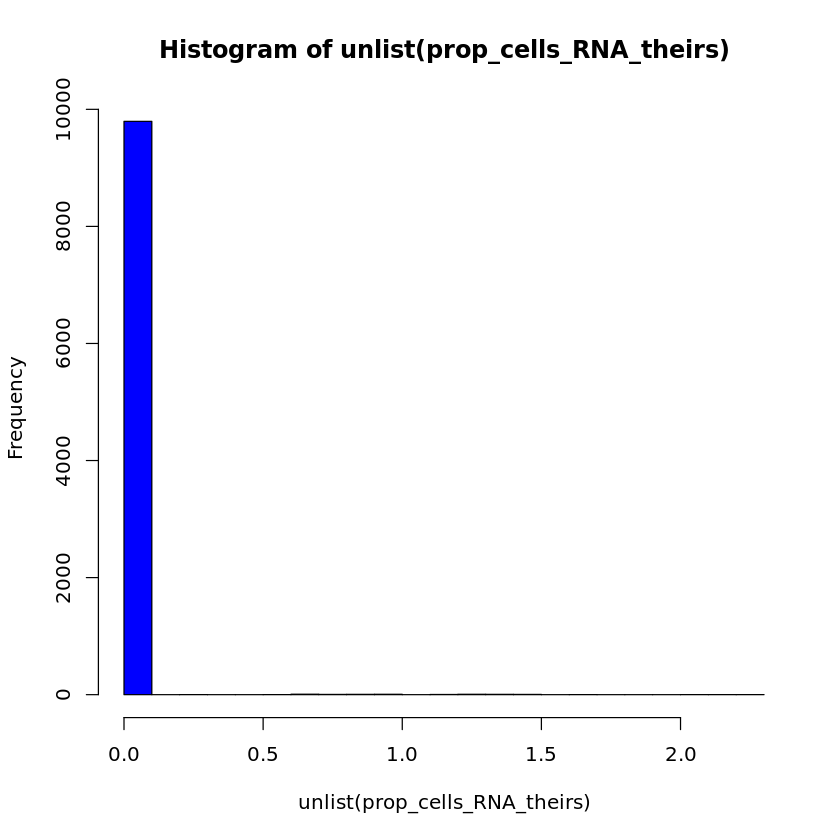

In [29]:
#sum(prop_cells_RNA_theirs)
#sum(prop_cells_RNA_ours)
#sum(prop_cells_ATAC_theirs)
#sum(prop_cells_ATAC_ours)

#jpeg(file="prop_cells_RNA_theirs1.jpeg")
#prop_cells_RNA_ours
#par(mfrow=c(1,2))
hist(unlist(prop_cells_RNA_theirs), breaks=20, col="blue")
#hist(unlist(prop_cells_RNA_ours), breaks=20, col="blue")
dev.off()

In [116]:
mat_theirs <- logcounts(scRNA_theirs)
num_genes_RNA_theirs <- mat_theirs[,Matrix::colSums(mat_theirs)>0,]
mat_ours <- norm.cnts_RNA
num_genes_RNA_ours <- mat_ours[,Matrix::colSums(mat_ours)>0,]

mat_theirs <- logcounts(scATAC_theirs)
num_genes_ATAC_theirs <- mat_theirs[,Matrix::colSums(mat_theirs)>0,]
mat_ours <- norm.cnts_ATAC
num_genes_ATAC_ours <- mat_ours[,Matrix::colSums(mat_ours)>0,]


In [22]:
sum(num_genes_RNA_theirs)
sum(num_genes_RNA_ours)
sum(num_genes_ATAC_ours)

[1] 40941100

[1] 69126354

[1] 324330153

In [117]:
num_genes_ATAC_ours

   [[ suppressing 32 column names 'CB:Z:AAACGAAAGAACGTTA-pool14', 'CB:Z:AAACGAAAGAACGTTA-pool20', 'CB:Z:AAACGAAAGAAGCCGT-pool24' ... ]]

   [[ suppressing 32 column names 'CB:Z:AAACGAAAGAACGTTA-pool14', 'CB:Z:AAACGAAAGAACGTTA-pool20', 'CB:Z:AAACGAAAGAAGCCGT-pool24' ... ]]

   [[ suppressing 32 column names 'CB:Z:AAACGAAAGAACGTTA-pool14', 'CB:Z:AAACGAAAGAACGTTA-pool20', 'CB:Z:AAACGAAAGAAGCCGT-pool24' ... ]]



34408 x 82283 sparse Matrix of class "dgCMatrix"
                                                                                 
Zm00001eb000010 2.258527 1.2432249 0.4353726 .        .         .        .       
Zm00001eb000020 .        0.4803833 0.4353726 .        .         2.252411 .       
Zm00001eb000050 .        .         .         .        .         .        .       
Zm00001eb000060 .        .         .         .        .         .        .       
Zm00001eb000070 .        .         .         .        .         .        .       
Zm00001eb000080 .        .         .         .        .         .        .       
Zm00001eb000100 .        .         .         .        .         .        .       
Zm00001eb000120 .        .         0.4353726 .        .         .        .       
Zm00001eb000140 .        .         .         .        .         .        .       
Zm00001eb000150 .        .         .         .        .         .        .       
Zm00001eb000170 2.258527 1.8795025 .         .   

In [125]:
mat_ours <- norm.cnts_ATAC
num_genes_ATAC_ours <- mat_ours[,Matrix::colSums(mat_ours)>0,]

In [126]:
num_genes_ATAC_ours

   [[ suppressing 32 column names 'CB:Z:AAACGAAAGAACGTTA-pool14', 'CB:Z:AAACGAAAGAACGTTA-pool20', 'CB:Z:AAACGAAAGAAGCCGT-pool24' ... ]]

   [[ suppressing 32 column names 'CB:Z:AAACGAAAGAACGTTA-pool14', 'CB:Z:AAACGAAAGAACGTTA-pool20', 'CB:Z:AAACGAAAGAAGCCGT-pool24' ... ]]

   [[ suppressing 32 column names 'CB:Z:AAACGAAAGAACGTTA-pool14', 'CB:Z:AAACGAAAGAACGTTA-pool20', 'CB:Z:AAACGAAAGAAGCCGT-pool24' ... ]]



34408 x 82283 sparse Matrix of class "dgCMatrix"
                                                                                 
Zm00001eb000010 2.258527 1.2432249 0.4353726 .        .         .        .       
Zm00001eb000020 .        0.4803833 0.4353726 .        .         2.252411 .       
Zm00001eb000050 .        .         .         .        .         .        .       
Zm00001eb000060 .        .         .         .        .         .        .       
Zm00001eb000070 .        .         .         .        .         .        .       
Zm00001eb000080 .        .         .         .        .         .        .       
Zm00001eb000100 .        .         .         .        .         .        .       
Zm00001eb000120 .        .         0.4353726 .        .         .        .       
Zm00001eb000140 .        .         .         .        .         .        .       
Zm00001eb000150 .        .         .         .        .         .        .       
Zm00001eb000170 2.258527 1.8795025 .         .   

In [120]:
mat_theirs <- logcounts(scRNA_theirs)

prop_cells_RNA_theirs <- mat_theirs[Matrix::rowMeans(mat_theirs)>0,]


#num_genes <- mat[,Matrix::colSums(mat>0),]
mat_ours <- norm.cnts_RNA
prop_cells_RNA_ours <- mat_ours[Matrix::rowMeans(mat_ours)>0,]


mat_theirs <- logcounts(scATAC_theirs)
prop_cells_ATAC_theirs <- mat_theirs[Matrix::rowMeans(mat_theirs)>0,]
#num_genes <- mat[,Matrix::colSums(mat>0),]
mat_ours <- norm.cnts_ATAC
prop_cells_ATAC_ours <- mat_ours[Matrix::rowMeans(mat_ours)>0,]

mat_theirs <- logcounts(scRNA_theirs)
num_genes_RNA_theirs <- mat_theirs[,Matrix::colSums(mat_theirs)>0,]
mat_ours <- norm.cnts_RNA
num_genes_RNA_ours <- mat_ours[,Matrix::colSums(mat_ours)>0,]

mat_theirs <- logcounts(scATAC_theirs)
num_genes_ATAC_theirs <- mat_theirs[,Matrix::colSums(mat_theirs)>0,]
mat_ours <- norm.cnts_ATAC
num_genes_ATAC_ours <- mat_ours[,Matrix::colSums(mat_ours)>0,]


In [ ]:
list_colSums_RNA_theirs <- colSums (logcounts(scRNA_theirs), na.rm = FALSE, dims = 1)
list_colMeans_RNA_theirs <- colMeans (logcounts(scRNA_theirs), na.rm = FALSE, dims = 1)
list_rowSums_RNA_theirs <- rowSums(logcounts(scRNA_theirs), na.rm = FALSE, dims = 1)
list_rowMeans_RNA_theirs <- rowMeans(logcounts(scRNA_theirs), na.rm = FALSE, dims = 1)
##########################


norm.cnts_RNA <- log1p((scRNA_ours[common_genes, ]) %*% Diagonal(x=1e4/Matrix::colSums(scRNA_ours[common_genes, ])))
#norm.cnts
list_colSums_RNA_ours <- list(colSums(norm.cnts_RNA, na.rm = FALSE, dims = 1))
list_colMeans_RNA_ours <- list(colMeans(norm.cnts_RNA, na.rm = FALSE, dims = 1))
list_rowSums_RNA_ours <- list(rowSums(norm.cnts_RNA, na.rm = FALSE, dims = 1))
list_rowMeans_RNA_ours <- list(rowMeans(norm.cnts_RNA, na.rm = FALSE, dims = 1))

list_colSums_ATAC_theirs <- colSums (logcounts(scATAC_theirs), na.rm = FALSE, dims = 1)
list_colMeans_ATAC_theirs <- colMeans(logcounts(scATAC_theirs), na.rm = FALSE, dims = 1)
list_rowSums_ATAC_theirs <- rowSums (logcounts(scATAC_theirs), na.rm = FALSE, dims = 1)
list_rowMeans_ATAC_theirs <- rowMeans(logcounts(scATAC_theirs), na.rm = FALSE, dims = 1)

norm.cnts_ATAC <- log1p((scATAC_ours[common_genes, ]) %*% Diagonal(x=1e4/Matrix::colSums(scATAC_ours[common_genes, ])))
#norm.cnts
list_colSums_ATAC_ours <- list(colSums(norm.cnts_ATAC, na.rm = FALSE, dims = 1))
list_colMeans_ATAC_ours <- list(colMeans(norm.cnts_ATAC, na.rm = FALSE, dims = 1))
list_rowSums_ATAC_ours <- list(rowSums(norm.cnts_ATAC, na.rm = FALSE, dims = 1))
list_rowMeans_ATAC_ours <- list(rowMeans(norm.cnts_ATAC, na.rm = FALSE, dims = 1))


In [ ]:
#library(gridExtra)
jpeg(file="colsum_saving_RNA_plot1.jpeg")
#hist(Temperature, col="darkgreen")
#dev.off()
par(mfrow=c(1,2))
hist(unlist(list_colSums_RNA_theirs), breaks=20, col="blue")
hist(unlist(list_colSums_RNA_ours), breaks=20, col="blue")
#par(mfrow = c(2,1))    
dev.off()

#grid.arrange(plot1, plot2, ncol=2)
jpeg(file="colsum_saving_RNA_plot2.jpeg")

par(mfrow=c(1,2))
hist(unlist(list_colMeans_RNA_theirs), breaks=20, col="blue")
hist(unlist(list_colMeans_RNA_ours), breaks=20, col="blue")
dev.off()

jpeg(file="colsum_saving_RNA_plot3.jpeg")

par(mfrow=c(1,2))
hist(unlist(list_rowSums_RNA_theirs), breaks=20, col="blue")
hist(unlist(list_rowSums_RNA_ours), breaks=20, col="blue")
dev.off()

jpeg(file="colsum_saving_RNA_plot4.jpeg")


par(mfrow=c(1,2))
hist(unlist(list_rowMeans_RNA_theirs), breaks=20, col="blue")
hist(unlist(list_rowMeans_RNA_ours), breaks=20, col="blue")

dev.off()
#hist(unlist(list_colSums_RNA_theirs), breaks=20, col="blue")
#hist(unlist(list_colSums_RNA_ours), breaks=20, col="blue")
#hist(unlist(list_colSums_RNA_theirs), breaks=20, col="blue")
#par(new=TRUE)
#hist(unlist(list_colSums_RNA_ours), breaks=20, col="blue")
#hist(unlist(list_colMeans_RNA_theirs), breaks=20, col="blue")
#hist(unlist(list_rowSums_RNA_theirs), breaks=20, col="blue")
#hist(unlist(list_rowMeans_RNA_theirs), breaks=20, col="blue")
#library(gridExtra)
jpeg(file="colsum_saving_ATAC_plot1.jpeg")

par(mfrow=c(1,2))
hist(unlist(list_colSums_ATAC_theirs), breaks=20, col="blue")
hist(unlist(list_colSums_ATAC_ours), breaks=20, col="blue")
#par(mfrow = c(2,1))    
dev.off()

#grid.arrange(plot1, plot2, ncol=2)
jpeg(file="colsum_saving_ATAC_plot2.jpeg")

par(mfrow=c(1,2))
hist(unlist(list_colMeans_ATAC_theirs), breaks=20, col="blue")
hist(unlist(list_colMeans_ATAC_ours), breaks=20, col="blue")
dev.off()

jpeg(file="colsum_saving_ATAC_plot3.jpeg")

par(mfrow=c(1,2))
hist(unlist(list_rowSums_ATAC_theirs), breaks=20, col="blue")
hist(unlist(list_rowSums_ATAC_ours), breaks=20, col="blue")
dev.off()

jpeg(file="colsum_saving_ATAC_plot4.jpeg")

par(mfrow=c(1,2))
hist(unlist(list_rowMeans_ATAC_theirs), breaks=20, col="blue")
hist(unlist(list_rowMeans_ATAC_ours), breaks=20, col="blue")
dev.off()
